# Installing the package

Uncomment this line to download the package. For best results, install PyVaR in a fresh Python environment to avoid conflicts with existing packages.

In [1]:
#pip install git+https://github.com/Alessandro-Dodon/pyvar.git#subdirectory=package

---

## Notebook Overview

This notebook is dedicated to **simulation-based methods** for portfolio risk analysis. Instead of relying on closed-form analytic formulas, we estimate risk through scenarios generated from historical or simulated distributions.

We focus on the most widely used simulation techniques for both **equity and option portfolios**, leveraging the **Black-Scholes framework** for pricing.
The methods covered include:

- **Monte Carlo (MC) simulation** based on normal innovations
- A more flexible **GMM-based simulation** 
- **Historical Simulation (HS)** based on actual past returns
- **Weighted Historical Simulation (WHS)** for time-decaying shocks
- **Filtered Historical Simulation (FHS)** combining volatility modeling with empirical return sampling

These techniques allow us to capture non-linear instruments, making simulation a powerful tool for realistic portfolio VaR and Expected Shortfall estimation.


### Packages

We begin by importing the `pyvar` package along with other necessary libraries for data handling, analysis, and visualization. Ensure all required packages are installed in your environment before proceeding.

In [2]:
import pyvar as pv

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.mixture import GaussianMixture
import seaborn as sns
from matplotlib.ticker import FuncFormatter

---

### Creating a Portfolio 

Our package provides simple functions to automatically build your portfolio: prices are downloaded from Yahoo Finance, you specify the number of shares, and optionally convert everything to your base currency (CHF in our case). Those are particularly useful to check common problems like missing values, stability of the VCV matrix etc.

Our example portfolio follows a stylized global equity strategy:  
- Long positions in broad market, regional, and sector ETFs (VT, SPY, VGK, EWJ, VWO)  
- Exposure to leading firms in tech, healthcare, and consumer sectors (AAPL, JNJ, PG, UNH, NVS)  
- A small short position in industrials (XLI) to hedge against cyclical downturns

We assume a **buy-and-hold** or "lazy portfolio" strategy. No active trading or rebalancing is considered. If the portfolio composition changes, all subsequent VaR and ES metrics must be recomputed from that point onward.

In [4]:
# Define shares — globally diversified portfolio
shares = pd.Series({
    "VT": 120,     # Global equity ETF
    "SPY": 80,     # US large-cap ETF
    "VGK": 60,     # Europe ETF
    "EWJ": 40,     # Japan ETF
    "VWO": 60,     # Emerging Markets ETF
    "AAPL": 50,    # Apple — tech
    "JNJ": 50,     # Johnson & Johnson — healthcare
    "PG": 40,      # Procter & Gamble — consumer staples
    "UNH": 40,     # UnitedHealth — healthcare
    "NVS": 30,     # Novartis — Swiss healthcare
    "XLI": -30     # US industrials sector ETF — short hedge
})

# Download prices and convert to base currency
tickers = shares.index.tolist()
raw_prices = pv.get_raw_prices(tickers, start="2023-01-01", end="2025-01-01")
prices_chf = pv.convert_to_base_currency(raw_prices, base_currency="CHF")

# Compute monetary position values over time
portfolio_matrix = pv.create_portfolio(prices_chf, shares)

# Compute portfolio returns and statistics
portfolio_returns = pv.compute_returns(portfolio_matrix)

[currency detection] AAPL: USD
[currency detection] EWJ: USD
[currency detection] JNJ: USD
[currency detection] NVS: USD
[currency detection] PG: USD
[currency detection] SPY: USD
[currency detection] UNH: USD
[currency detection] VGK: USD
[currency detection] VT: USD
[currency detection] VWO: USD
[currency detection] XLI: USD
[fx download] Downloading FX pairs: CHFUSD=X
[conversion] AAPL: USD → CHF via CHFUSD=X
[conversion] EWJ: USD → CHF via CHFUSD=X
[conversion] JNJ: USD → CHF via CHFUSD=X
[conversion] NVS: USD → CHF via CHFUSD=X
[conversion] PG: USD → CHF via CHFUSD=X
[conversion] SPY: USD → CHF via CHFUSD=X
[conversion] UNH: USD → CHF via CHFUSD=X
[conversion] VGK: USD → CHF via CHFUSD=X
[conversion] VT: USD → CHF via CHFUSD=X
[conversion] VWO: USD → CHF via CHFUSD=X
[conversion] XLI: USD → CHF via CHFUSD=X


In [5]:
prices_chf.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,231.426704,59.223917,128.896222,85.194986,149.932985,537.041999,449.589076,56.368558,106.685961,40.067612,119.804957
2024-12-26,232.407133,59.973532,128.793635,85.328432,151.175409,537.645712,454.555311,56.578238,106.923679,40.011427,120.021024
2024-12-27,229.196950,60.393619,128.250566,85.270424,150.528611,531.678524,453.261519,56.360245,106.023655,39.845030,119.058198
2024-12-30,226.896698,60.081229,127.153121,84.627656,148.847330,527.330344,452.791238,56.172813,105.341614,39.625007,118.246502
2024-12-31,225.645051,60.120737,128.487744,84.741616,149.578046,526.227574,451.761624,56.268884,105.263231,39.623541,118.286434


In [6]:
# Compute latest portfolio value and weights
latest_prices = prices_chf.iloc[-1]
portfolio_value_chf = (shares * latest_prices).sum()
weights = (shares * latest_prices) / portfolio_value_chf

# Print final portfolio value and weights
print(f"\nFinal portfolio value in CHF: {portfolio_value_chf:,.2f}\n")
print("Portfolio weights (based on latest prices):")
print(weights.round(4).sort_values(ascending=False))


Final portfolio value in CHF: 103,642.05

Portfolio weights (based on latest prices):
SPY     0.4062
UNH     0.1744
VT      0.1219
AAPL    0.1089
JNJ     0.0620
PG      0.0577
VGK     0.0326
NVS     0.0245
EWJ     0.0232
VWO     0.0229
XLI    -0.0342
dtype: float64


A quick way to observe the correlations of our portfolio!


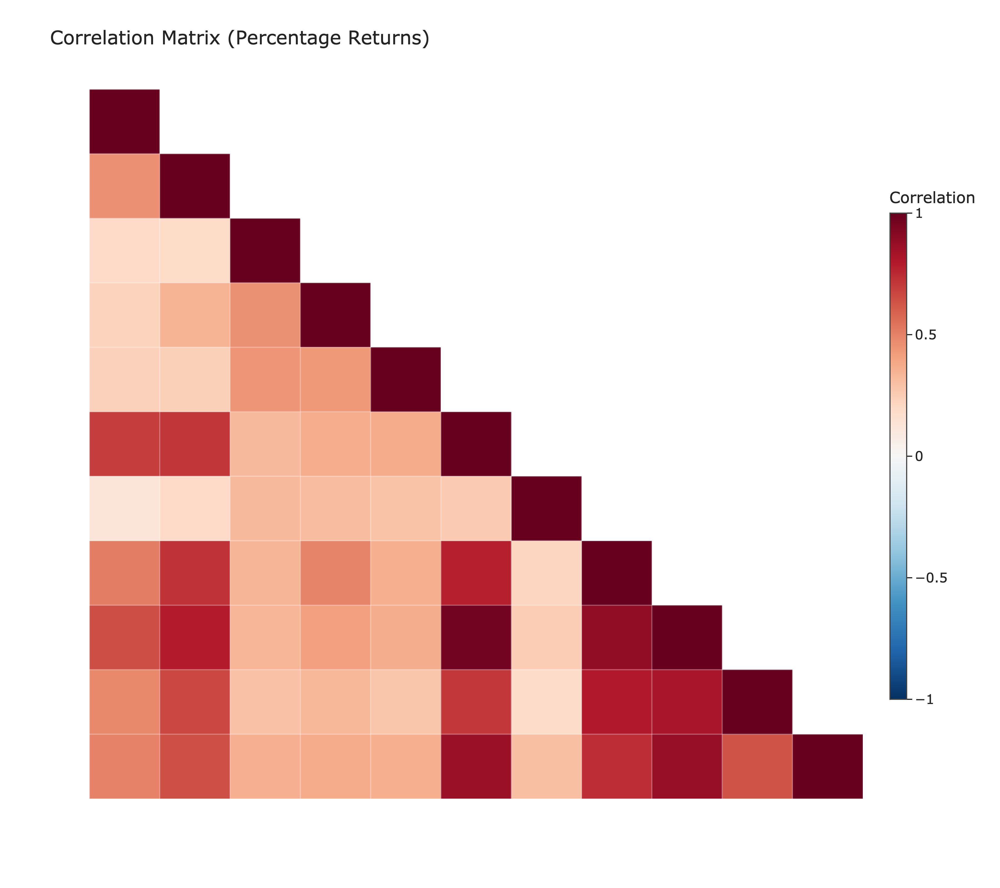

In [7]:
pv.plot_correlation_matrix(portfolio_matrix, interactive=False)

In [8]:
portfolio_matrix.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,11571.335187,2368.956681,6444.811080,2555.849567,5997.319403,42963.359906,17983.563021,3382.113458,12802.315271,2404.056728,-3594.148724
2024-12-26,11620.356641,2398.941292,6439.681748,2559.852947,6047.016349,43011.656968,18182.212443,3394.694253,12830.841531,2400.685620,-3600.630706
2024-12-27,11459.847524,2415.744774,6412.528308,2558.112730,6021.144452,42534.281923,18130.460765,3381.614726,12722.838569,2390.701805,-3571.745932
2024-12-30,11344.834895,2403.249158,6357.656070,2538.829686,5953.893188,42186.427518,18111.649528,3370.368783,12640.993732,2377.500427,-3547.395061
2024-12-31,11282.252544,2404.829490,6424.387178,2542.248472,5983.121833,42098.205949,18070.464940,3376.133050,12631.587685,2377.412469,-3548.593034


In [9]:
portfolio_returns.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,0.017617,0.005464,0.010086,0.005047,0.011036,0.017251,0.005592,0.011608,0.014032,0.010130,0.013929
2024-12-26,0.004236,0.012657,-0.000796,0.001566,0.008287,0.001124,0.011046,0.003720,0.002228,-0.001402,0.001803
2024-12-27,-0.013813,0.007005,-0.004217,-0.000680,-0.004278,-0.011099,-0.002846,-0.003853,-0.008417,-0.004159,-0.008022
2024-12-30,-0.010036,-0.005173,-0.008557,-0.007538,-0.011169,-0.008178,-0.001038,-0.003326,-0.006433,-0.005522,-0.006818
2024-12-31,-0.005516,0.000658,0.010496,0.001347,0.004909,-0.002091,-0.002274,0.001710,-0.000744,-0.000037,0.000338


If you want to **save the DataFrame shown above**, use:

```python
portfolio_returns.to_csv("portfolio_returns.csv")
```

If you want to **import your own CSV**, make sure the first column contains dates and use:

```python
df = pd.read_csv("your_file.csv", index_col=0, parse_dates=True)
```

This ensures:
- The first column becomes the date index
- Dates are properly parsed for the analysis

Note: You are responsible for data cleaning and pre-processing when using your own files. Our data-download functions will print warnings if there are issues, but they do not perform automatic cleaning.

---

### One-Day Ahead Monte Carlo Simulation

The Monte Carlo simulation below estimates 1-day **VaR** and **Expected Shortfall (ES)** under the assumption that asset returns follow a **multivariate normal distribution** with parameters $(\mu, \Sigma)$ estimated from historical **log-returns**.

We simulate $N$ return vectors, apply **Cholesky decomposition** to introduce correlations, exponentiate the shocks to get price paths, and then reprice the full portfolio (stocks and options) for each scenario.

**Steps:**

1. Simulate $N$ log-return vectors:
   $$
   \log R_i \sim \mathcal{N}(\mu, \Sigma), \quad i = 1, \dots, N
   $$

2. Convert to one-day prices via exponentiation:
   $$
   S_i = S_0 \cdot \exp(\log R_i)
   $$

3. Compute scenario-wise portfolio profit-and-loss $\Delta P_i$:
   - equity: linear change from simulated prices
   - options: revaluation using Black-Scholes:
     $$
     C(S_i, K, T - \Delta t, r, \sigma)
     $$

4. Define losses as $\ell_i = -\Delta P_i$ and compute:
   $$
   \text{VaR}_\alpha = Q_\alpha(\ell)
   $$
   $$
   \text{ES}_\alpha = \mathbb{E}[\ell \mid \ell \geq \text{VaR}_\alpha]
   $$

This method captures the **non-linear risk** of derivatives and the **joint distribution** of asset returns. However, it assumes **constant volatility and interest rates**, and is limited to **one-day ahead** unless explicitly extended.

We define below a simple set of options in our portfolio, alongside equities, which will be used consistently throughout this module.


In [10]:
# Use existing spot prices and volatilities
S0 = prices_chf.iloc[-1]
volatility_annualized = portfolio_returns.std() * np.sqrt(252)

# Select representative tickers for options
selected_tickers = ["VT", "SPY", "AAPL", "JNJ", "XLI"]

# Create example option contracts
options = [
    {
        "asset_index": tickers.index("AAPL"),
        "K": 200,
        "T": 60 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["AAPL"],
        "type": "call",
        "quantity": 3000,         # number of contracts
        "contract_size": 100         # unit size per contract
    },
    {
        "asset_index": tickers.index("XLI"),
        "K": 115,
        "T": 45 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["XLI"],
        "type": "put",
        "quantity": 5000,
        "contract_size": 100
    },
    {
        "asset_index": tickers.index("VT"),
        "K": 100,
        "T": 90 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["VT"],
        "type": "call",
        "quantity": 2500,
        "contract_size": 100
    }
]

In [11]:
# Print values of equity positions (already defined)
print("\nEquity Positions (latest prices):")
total_equity_value = 0
for tkr in tickers:
    position_value = shares[tkr] * S0[tkr]
    print(f"{tkr:5}: {shares[tkr]:4} × {S0[tkr]:.2f} = {position_value:,.2f} CHF")
    total_equity_value += position_value

# Price and print values of options
print("\nOption Values (Black-Scholes at time 0):")
total_option_value = 0
for i, opt in enumerate(options):
    spot = S0[tickers[opt["asset_index"]]]
    price_bs = pv.black_scholes_pricing(
        spot, opt["K"], opt["T"], opt["r"], opt["sigma"], opt["type"]
    )
    option_value = price_bs * opt["quantity"] * opt["contract_size"]
    print(f"Option {i+1} on {tickers[opt['asset_index']]} ({opt['type']}): "
          f"BS = {price_bs:.2f} × {opt['quantity']} × {opt['contract_size']} = {option_value:,.2f} CHF")
    total_option_value += option_value

# Print new portfolio value
total_portfolio_value = total_equity_value + total_option_value
print(f"\nTotal equity value:     {total_equity_value:,.2f} CHF")
print(f"Total option value:     {total_option_value:,.2f} CHF")
print(f"Total portfolio value:  {total_portfolio_value:,.2f} CHF")


Equity Positions (latest prices):
VT   :  120 × 105.26 = 12,631.59 CHF
SPY  :   80 × 526.23 = 42,098.21 CHF
VGK  :   60 × 56.27 = 3,376.13 CHF
EWJ  :   40 × 60.12 = 2,404.83 CHF
VWO  :   60 × 39.62 = 2,377.41 CHF
AAPL :   50 × 225.65 = 11,282.25 CHF
JNJ  :   50 × 128.49 = 6,424.39 CHF
PG   :   40 × 149.58 = 5,983.12 CHF
UNH  :   40 × 451.76 = 18,070.46 CHF
NVS  :   30 × 84.74 = 2,542.25 CHF
XLI  :  -30 × 118.29 = -3,548.59 CHF

Option Values (Black-Scholes at time 0):
Option 1 on AAPL (call): BS = 27.80 × 3000 × 100 = 8,340,658.11 CHF
Option 2 on XLI (put): BS = 1.81 × 5000 × 100 = 902,881.18 CHF
Option 3 on VT (call): BS = 7.13 × 2500 × 100 = 1,781,738.82 CHF

Total equity value:     103,642.05 CHF
Total option value:     11,025,278.11 CHF
Total portfolio value:  11,128,920.16 CHF


#### General Simulations Parameters

In [12]:
# General parameters
confidence_level = 0.99
simulations = 10_000
seed = 1

In [13]:
# Run Parametric Monte Carlo VaR and ES 
var_mc, pnl_mc = pv.monte_carlo_simulation_var(
    price_data=prices_chf,  
    shares=shares,
    options=options,
    confidence_level=confidence_level,
    simulations=simulations, 
    seed=seed)

# Calculate ES
es_mc = pv.simulation_es(var_mc, pnl_mc)

# Display Monte Carlo Results
print(f"Monte Carlo VaR ({int(confidence_level * 100)}%):  {var_mc:,.2f} CHF")
print(f"Monte Carlo ES ({int(confidence_level * 100)}%):  {es_mc:,.2f} CHF")

Monte Carlo VaR (99%):  4,412,144.66 CHF
Monte Carlo ES (99%):  5,087,182.08 CHF



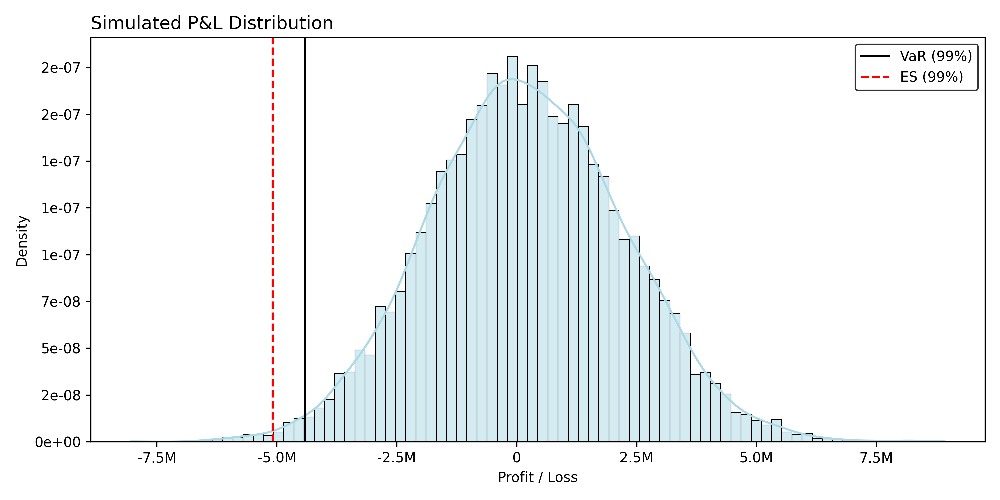

In [14]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_mc,
    var=var_mc,
    es=es_mc,
    confidence_level=confidence_level
)

---

### One-Day Ahead Monte Carlo with Gaussian Mixture Model (GMM)

This simulation method extends the normal Monte Carlo approach by assuming that asset log-returns follow a **Gaussian Mixture Model (GMM)** instead of a single multivariate normal distribution.

The GMM allows for **fat tails**, **asymmetry**, and **regime-switching behavior** by mixing multiple normal distributions:

$$
f(r) = \sum_{k=1}^K \pi_k \, \mathcal{N}(r \mid \mu_k, \Sigma_k)
$$

Where:
- $K$ is the number of components (e.g. 2 or 3),
- $\pi_k$ are the mixture weights,
- $\mu_k$, $\Sigma_k$ are the mean and covariance of each component.

**Simulation Steps:**

1. Estimate GMM parameters from historical **log-returns**.
2. For each of the $N$ scenarios:
   - Randomly choose component $k$ with probability $\pi_k$.
   - Sample a return vector $r_i \sim \mathcal{N}(\mu_k, \Sigma_k)$.
3. Convert to prices:
   $$
   S_i = S_0 \cdot \exp(r_i)
   $$
4. Recompute portfolio P&L for each scenario (stocks + options).
5. Compute VaR and ES as in standard Monte Carlo.

GMM simulations provide more realistic tail behavior than standard normal simulations, while still being tractable. They are especially useful when historical returns exhibit **non-Gaussian features**.


In [15]:
# GMM components
n_components = 3 # Can try other values

In [16]:
# Run GMM-based Monte Carlo VaR and ES
var_gmm, pnl_gmm = pv.gmm_monte_carlo_simulation_var(
    price_data=prices_chf,     
    shares=shares,
    options=options,
    confidence_level=confidence_level,
    simulations=simulations,
    seed=seed,
    n_components=n_components
)

# Calculate ES
es_gmm = pv.simulation_es(var_gmm, pnl_gmm)

# Display GMM Monte Carlo Results
print(f"GMM Monte Carlo VaR ({int(confidence_level * 100)}%):  {var_gmm:,.2f} CHF")
print(f"GMM Monte Carlo ES ({int(confidence_level * 100)}%):  {es_gmm:,.2f} CHF")

GMM Monte Carlo VaR (99%):  4,775,853.35 CHF
GMM Monte Carlo ES (99%):  5,642,688.11 CHF



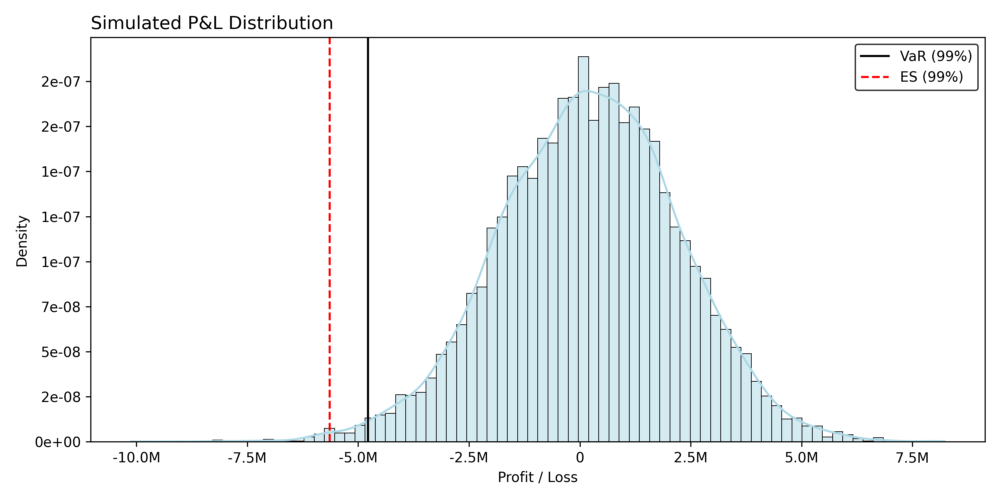

In [17]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_gmm,
    var=var_gmm,
    es=es_gmm,
    confidence_level=confidence_level
)

We inspect the fitted GMM components to see how different return regimes are captured through their weights, means, and volatilities.

In [18]:
# Fit GMM to portfolio returns
n_components = n_components  # Same as used in the simulation
gmm_model = GaussianMixture(n_components=n_components, random_state=seed)
gmm_model.fit(portfolio_returns.values.reshape(-1, 1))

# Extract and print GMM parameters
print("\nFitted GMM Parameters:")
for i in range(n_components):
    weight = gmm_model.weights_[i]
    mean = gmm_model.means_[i, 0]
    std = np.sqrt(gmm_model.covariances_[i, 0, 0])
    print(f"Component {i+1}: weight = {weight:.4f}, mean = {mean:.5f}, std = {std:.5f}")


Fitted GMM Parameters:
Component 1: weight = 0.2147, mean = 0.00634, std = 0.01430
Component 2: weight = 0.6126, mean = 0.00080, std = 0.00779
Component 3: weight = 0.1727, mean = -0.00786, std = 0.01484


---

### One-Day Ahead Bootstrapped Historical Simulation

The **bootstrapped historical simulation** is a variation of the standard historical approach where past return shocks are **randomly resampled with replacement**.

Instead of using all historical returns in order, we generate synthetic scenarios by drawing (with replacement) from the past.

This allows for:
- More flexible scenario generation,
- Estimating risk with fewer data points,

The portfolio is revalued for each synthetic return, and the VaR is computed from the resulting P&L distribution.


In [19]:
# Bootstrapped Historical Simulation (1-day, 99%)
var_historical_bootstrap, pnl_historical_bootstrap = pv.historical_simulation_var(
    price_data=prices_chf,
    shares=shares.values,
    options=options,
    confidence_level=confidence_level,
    bootstrap=True,
    simulations=simulations,
    seed=seed
)

# ES
es_historical_bootstrap = pv.simulation_es(var_historical_bootstrap, pnl_historical_bootstrap)

# Print results
print(f"Bootstrapped Historical VaR (99%):   {var_historical_bootstrap:,.2f} CHF")
print(f"Bootstrapped Historical ES  (99%):   {es_historical_bootstrap:,.2f} CHF")


Bootstrapped Historical VaR (99%):   4,319,540.91 CHF
Bootstrapped Historical ES  (99%):   5,566,591.23 CHF



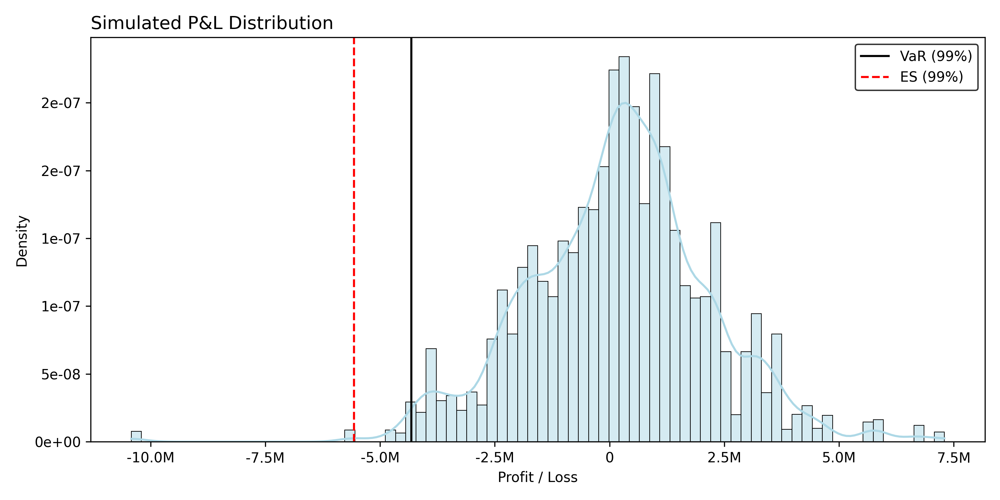

In [20]:
# Plot bootstrapped HS distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_historical_bootstrap,
    var=var_historical_bootstrap,
    es=es_historical_bootstrap,
    confidence_level=confidence_level
)

---

### One-Day Ahead Weighted Historical Simulation (WHS)

The Weighted Historical Simulation (WHS) method modifies standard historical simulation by giving **more weight to recent observations**, using an **exponential decay scheme**:

$$
w_t = \alpha_0 \cdot \lambda^t, \quad \text{where } \alpha_0 = \frac{1 - \lambda}{1 - \lambda^n}
$$

for $t = 0, 1, \dots, n - 1$, and $\lambda \in (0,1)$ is a decay factor. These weights sum to 1 and are highest for the most recent observations ($t = 0$).

VaR is computed as the **weighted quantile**, and ES is adjusted accordingly:

$$
\text{VaR}_\alpha = Q_\alpha^{(w)}(\ell), \qquad
\text{ES}_\alpha = \frac{\sum_{i:\, \ell_i \geq \text{VaR}_\alpha} w_i \, \ell_i}{\sum_{i:\, \ell_i \geq \text{VaR}_\alpha} w_i}
$$


In [21]:
# Adjust decay factor as needed
lambda_decay = 0.97

In [22]:
# Run Weighted Historical Simulation (1-day horizon, 99% confidence)
var_whs, pnl_whs = pv.weighted_historical_simulation_var(
    price_data=prices_chf,
    shares=shares.values,
    options=options,
    confidence_level=confidence_level,
    lambda_decay=lambda_decay
)

# Calculate ES
es_whs = pv.simulation_es(var_whs, pnl_whs, lambda_decay)

# Display results
print(f"Weighted Historical Simulation VaR (99%):   {var_whs:,.2f} CHF")
print(f"Weighted Historical Simulation ES  (99%):   {es_whs:,.2f} CHF")

Weighted Historical Simulation VaR (99%):   5,584,226.16 CHF
Weighted Historical Simulation ES  (99%):   5,837,929.42 CHF



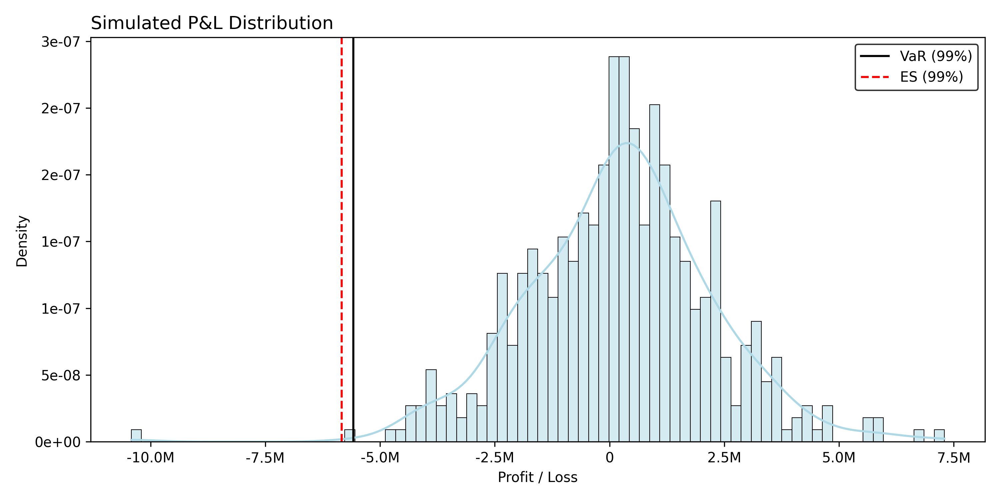

In [23]:
# Plot bootstrapped HS distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_whs,
    var=var_whs,
    es=es_whs,
    confidence_level=confidence_level
)

---

### One-Day Ahead Filtered Historical Simulation (FHS)

**Filtered Historical Simulation** combines historical return information with time-varying volatility estimated from GARCH-type models. This method addresses the **volatility clustering** often observed in financial returns, which standard historical methods fail to capture.

The core procedure is:

1. Model conditional volatility of each asset using a GARCH process on past returns:
   $$
   r_t = \sigma_t \cdot \epsilon_t, \quad \epsilon_t \sim \text{i.i.d.}
   $$
   where $\sigma_t$ is the time-varying volatility, and $\epsilon_t$ are the standardized residuals.


2. Standardize historical returns to extract the residuals:
   $$
   \epsilon_t = \frac{r_t}{\sigma_t}
   $$


3. Resample residuals (with or without replacement) to generate future innovations. 


4. Scale back using the latest forecasted volatility:
   $$
   \tilde{r}_{t+1} = \sigma_{T} \cdot \epsilon^*_{t}
   $$
   where $\epsilon^*_{t}$ is a resampled standardized residual from the historical set $\{\epsilon_t\}$, as done in this simulation.


5. Apply simulated returns to current prices, revalue the portfolio, and compute the P&L distribution.


This approach improves standard historical VaR by incorporating time-varying risk. FHS is especially effective in stressed markets or periods of volatility change.

In [24]:
# Run Filtered Historical Simulation (1-day horizon, 99% confidence)
var_fhs, pnl_fhs = pv.filtered_historical_simulation_var(
    price_data=prices_chf,
    shares=shares.values,
    options=options,
    confidence_level=confidence_level,
    bootstrap=True,
    simulations=simulations,
    seed=seed,
    p=1,
    q=1,
    model="GJR",         # or "EGARCH", "GJR", "APARCH"
    distribution="skewt"  # or "t", "ged", "skewt"
)

# Calculate ES
es_fhs = pv.simulation_es(var_fhs, pnl_fhs)

In [25]:
# Display results
print(f"Filtered Historical Simulation VaR (99%):   {var_fhs:,.2f} CHF")
print(f"Filtered Historical Simulation ES  (99%):   {es_fhs:,.2f} CHF")

Filtered Historical Simulation VaR (99%):   5,768,678.12 CHF
Filtered Historical Simulation ES  (99%):   6,848,597.48 CHF



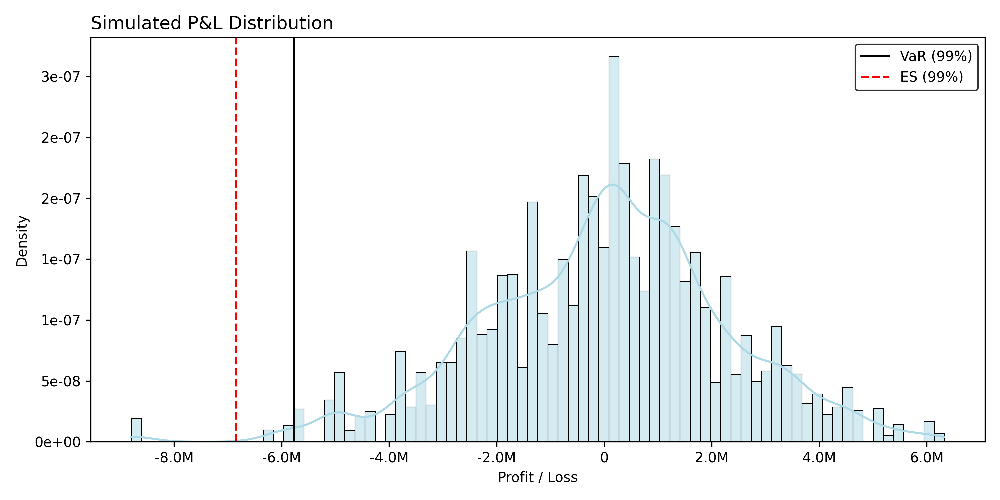

In [26]:
# Plot FHS distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_fhs,
    var=var_fhs,
    es=es_fhs,
    confidence_level=0.99
)

#### Comparison of Simulation-Based VaR Methods

We compare the 1-day P&L distributions generated by the main simulation-based VaR methods, including:

- Monte Carlo (Normal)  
- GMM-based Monte Carlo  
- Bootstrap Simulation  
- Weighted Historical Simulation (WHS)  
- Filtered Historical Simulation (FHS) 

For each method, we visualize the **kernel density estimate (KDE)** of simulated losses and mark the corresponding VaR level at a 99% confidence.

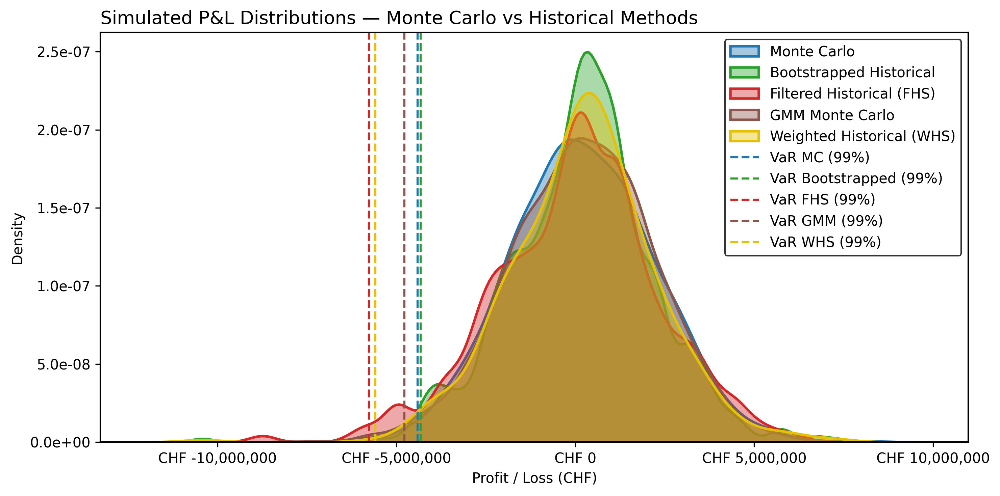

In [27]:
# Plot
plt.figure(figsize=(10, 5), dpi=300)

# KDE plots (filled, smooth)
sns.kdeplot(pnl_mc, label="Monte Carlo", fill=True, color="#1f77b4", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_historical_bootstrap, label="Bootstrapped Historical", fill=True, color="#2ca02c", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_fhs, label="Filtered Historical (FHS)", fill=True, color="#d62728", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_gmm, label="GMM Monte Carlo", fill=True, color="#8c564b", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_whs, label="Weighted Historical (WHS)", fill=True, color="#e5c100", linewidth=1.8, alpha=0.4)  

# VaR vertical lines
plt.axvline(-var_mc, color="#1f77b4", linestyle="--", linewidth=1.5, label="VaR MC (99%)")
plt.axvline(-var_historical_bootstrap, color="#2ca02c", linestyle="--", linewidth=1.5, label="VaR Bootstrapped (99%)")
plt.axvline(-var_fhs, color="#d62728", linestyle="--", linewidth=1.5, label="VaR FHS (99%)")
plt.axvline(-var_gmm, color="#8c564b", linestyle="--", linewidth=1.5, label="VaR GMM (99%)")
plt.axvline(-var_whs, color="#e5c100", linestyle="--", linewidth=1.5, label="VaR WHS (99%)")  

# Labels and title
plt.title("Simulated P&L Distributions — Monte Carlo vs Historical Methods", fontsize=13, loc="left", fontweight="medium")
plt.xlabel("Profit / Loss (CHF)")
plt.ylabel("Density")

# Axes styling
ax = plt.gca()
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"CHF {x:,.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.1e}"))

# Legend
plt.legend(frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()

In [28]:
# Create a dictionary of method names and their corresponding VaR values
var_summary = {
    "Monte Carlo (MC)": var_mc,
    "Bootstrapped Historical": var_historical_bootstrap,
    "Filtered Historical Simulation (FHS)": var_fhs,
    "Weighted Historical Simulation (WHS)": var_whs,
    "GMM Monte Carlo": var_gmm
}

# Print summary
print("Summary of 1-Day VaR Estimates (99% Confidence Level):\n")
for method, var in var_summary.items():
    print(f"{method:<40s}: CHF {var:,.2f}")


Summary of 1-Day VaR Estimates (99% Confidence Level):

Monte Carlo (MC)                        : CHF 4,412,144.66
Bootstrapped Historical                 : CHF 4,319,540.91
Filtered Historical Simulation (FHS)    : CHF 5,768,678.12
Weighted Historical Simulation (WHS)    : CHF 5,584,226.16
GMM Monte Carlo                         : CHF 4,775,853.35


---

### Multiday Extensions

We now explore the **multiday version** of simulation-based VaR for the **equity-only** portfolio. The focus is on projecting risk over a **3-months horizon** (~66 trading days) using two approaches:

- **Multiday Monte Carlo**: simulates paths using correlated normal returns.
- **Multiday GMM Simulation**: uses a fitted Gaussian Mixture Model to better capture fat tails and skewness.

These methods allow us to model compounding risk over longer periods while retaining flexibility in return dynamics.

In [29]:
# Forecast lenght
days_ahead = 66

In [30]:
# Run the simulation
var_mc_multiday, pnl_mc_multiday, portfolio_paths_mc_multiday = pv.multiday_monte_carlo_simulation_var(
    price_data=prices_chf,  
    shares=shares, 
    confidence_level=confidence_level,
    days_ahead=days_ahead,
    simulations=simulations,
    seed=seed
)

# ES
es_mc_multiday = pv.simulation_es(var_mc_multiday, pnl_mc_multiday)

# Print results
print(f"Monte Carlo multi-day VaR (99%):  {var_mc_multiday:,.2f} CHF")
print(f"Monte Carlo multi-day ES  (99%):  {es_mc_multiday:,.2f} CHF")

Monte Carlo multi-day VaR (99%):  11,909.65 CHF
Monte Carlo multi-day ES  (99%):  14,365.69 CHF



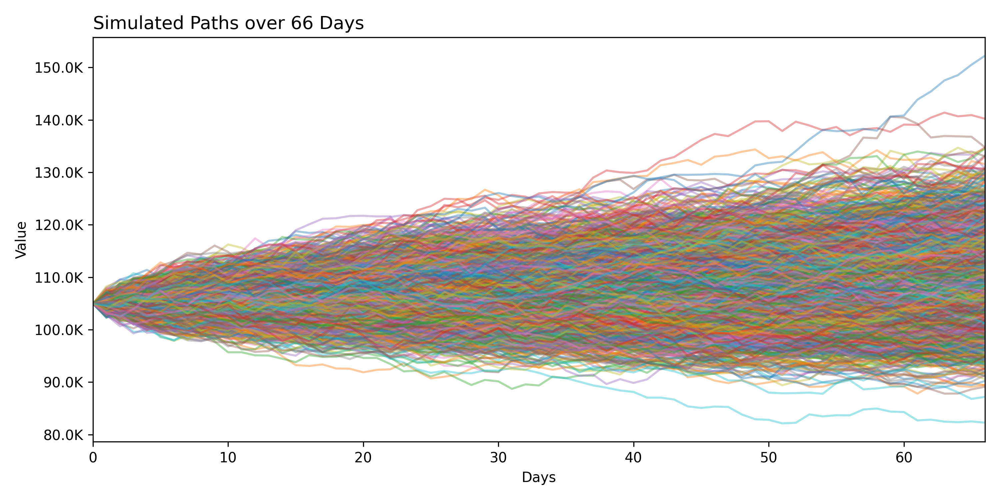

In [31]:
# Plot paths over time
pv.plot_simulated_paths(portfolio_paths_mc_multiday)

In [32]:
# Run GMM-based multiday Monte Carlo simulation
var_gmm_multiday, pnl_gmm_multiday, portfolio_paths_multiday_gmm = pv.multiday_gmm_monte_carlo_simulation_var(
    price_data=prices_chf,  
    shares=shares, 
    confidence_level=confidence_level,
    days_ahead=days_ahead,
    simulations=simulations,
    seed=seed,
    n_components=n_components   
)

# Compute Expected Shortfall
es_gmm_multiday = pv.simulation_es(var_gmm_multiday, pnl_gmm_multiday)

# Print results
print(f"GMM Monte Carlo 252-day VaR (99%):  {var_gmm_multiday:,.2f} CHF")
print(f"GMM Monte Carlo 252-day ES  (99%):  {es_gmm_multiday:,.2f} CHF")

GMM Monte Carlo 252-day VaR (99%):  12,343.01 CHF
GMM Monte Carlo 252-day ES  (99%):  14,325.25 CHF



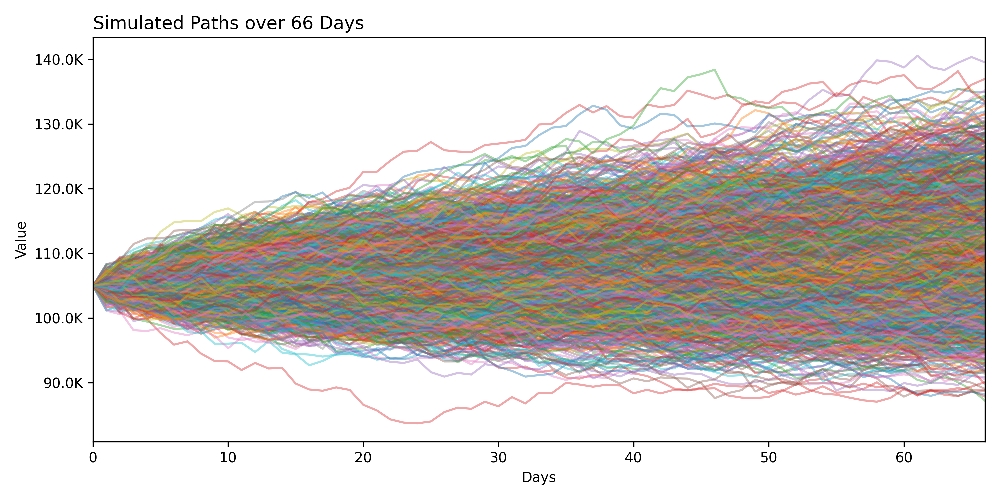

In [33]:
# Plot paths over time
pv.plot_simulated_paths(portfolio_paths_multiday_gmm)

#### Comparing Multiday GMM and Monte Carlo

We compare the simulated profit-and-loss distributions from the **GMM-based** and **standard Monte Carlo** approaches over a **66-day ahead forecast**. The GMM distribution shows **slightly fatter tails**, leading to marginally higher VaR estimates, though the overall difference is small.

This is expected, as return aggregation over longer horizons smooths distributional differences — a result of the Central Limit Theorem. Unless GMM components are highly distinct, their tail impact fades with time.

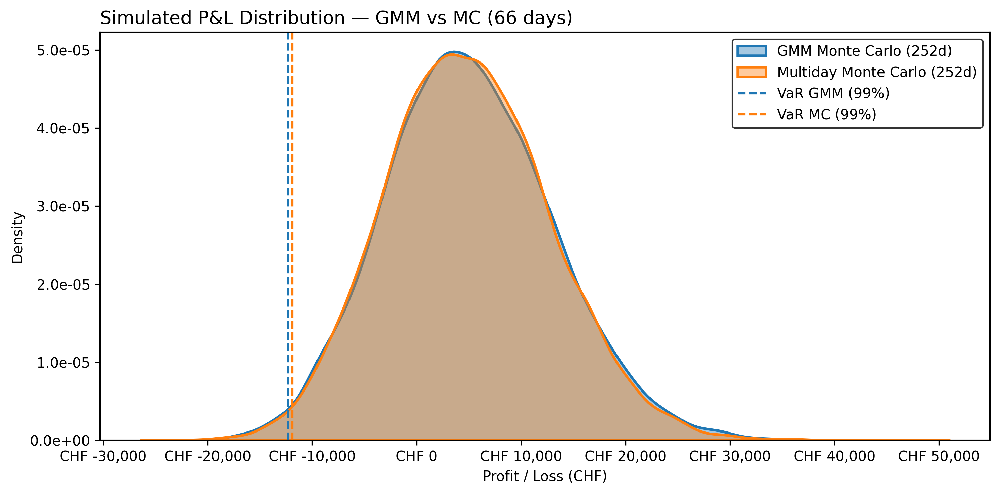

In [34]:
# Create the plot
plt.figure(figsize=(10, 5), dpi=300)

# KDE plots
sns.kdeplot(pnl_gmm_multiday, label="GMM Monte Carlo (252d)", fill=True, color="#1f77b4", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_mc_multiday, label="Multiday Monte Carlo (252d)", fill=True, color="#ff7f0e", linewidth=1.8, alpha=0.4)

# VaR lines
plt.axvline(-var_gmm_multiday, color="#1f77b4", linestyle="--", linewidth=1.5, label="VaR GMM (99%)")
plt.axvline(-var_mc_multiday, color="#ff7f0e", linestyle="--", linewidth=1.5, label="VaR MC (99%)")

# Title and labels
plt.title("Simulated P&L Distribution — GMM vs MC (66 days)", loc="left", fontsize=13, fontweight="medium")
plt.xlabel("Profit / Loss (CHF)")
plt.ylabel("Density")

# Axis styling
ax = plt.gca()
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')

# Format x-axis as currency
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"CHF {x:,.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.1e}"))

# Legend
plt.legend(frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()